In [277]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from glob import glob
import scipy.ndimage as ndi
import scipy.optimize as opt
import scipy.interpolate as interp
from joblib import Parallel, delayed
from tqdm import tqdm
from scipy.stats import median_abs_deviation
from astropy.convolution import Gaussian2DKernel, interpolate_replace_nans
from datetime import datetime
import re
import os
import seaborn as sns

divcmap = sns.color_palette("icefire", as_cmap=True)

plt.rcParams["image.cmap"] = "magma"
np.set_printoptions(linewidth=120)

import toolz as tz

listmap = tz.curry(tz.compose(list,map))
array_concat = tz.curry(np.concat)

In [3]:
def qhist(arr,bins=50,qmin=0.1,qmax=0.95,**kwargs):
    x = arr.ravel()
    plt.hist(x,bins=np.linspace(*np.quantile(x,[qmin,qmax]),bins),**kwargs)

def qimshow(arr,qmin=0.1,qmax=0.95,**kwargs):
    x = arr.ravel()
    plt.imshow(arr,vmin=np.quantile(x,qmin),vmax=np.quantile(x,qmax),**kwargs)

# Defs

In [28]:
from dataclasses import dataclass

@dataclass
class BayerImage:
    """
    Represents an image with Bayer pattern:

        R   G
        G   B
    """
    R: np.ndarray
    G1: np.ndarray
    B: np.ndarray
    G2: np.ndarray
        
    def __repr__(self):
        return f"<BayerImage of size {self.R.shape}>"

    def copy(self):
        return BayerImage(self.R.copy(),self.G1.copy(),self.B.copy(),self.G2.copy())

    def apply(self,foo,inplace=False):
        result = self if inplace else self.copy()
        for c in self.__annotations__:
            setattr(result, c, foo(getattr(result, c)))
        return result
        

    def to_array(self):
        shape = 2*np.array(self.R.shape)
        result = np.zeros(shape,dtype=self.R.dtype)
        result[0::2,0::2] = self.R.copy()
        result[1::2,0::2] = self.G1.copy()
        result[1::2,1::2] = self.B.copy()
        result[0::2,1::2] = self.G2.copy()
        return result

    def to_cube(self):
        return np.array([self.R,self.G1,self.G2,self.B])
        
    
    @classmethod
    def from_array(cls,A):
        R = A[0::2,0::2]
        G1 = A[1::2,0::2]
        B = A[1::2,1::2]
        G2 = A[0::2,1::2]
        return BayerImage(R=R,G1=G1,B=B,G2=G2)

In [5]:
class ArrayCover:
    def __init__(self,array):
        self.array = array
    def __repr__(self):
        return f"<ArrayCover {self.array.shape}>"


@tz.curry
def map_at(func,level,arg):
    "Applies the funcion `func` only at the requested level of object `arg`. For instance, level 2 will apply the function to every cell in a matrix."
    return tz.compose(*([listmap]*level))(func)(arg)

@tz.curry
def array_split_multi_axis(A,ns,start_axis=0):
    """Splits the i-th axis of the array A in ns[i] chunks. 
    The resulting object is a nested list with the same number of dimensions as the length of n, 
    and each element is an numpy.array representing the uncut final pieces. """
    if not ns:
        return A
    else:
        return listmap(array_split_multi_axis(ns=ns[1:],start_axis=start_axis+1),np.array_split(A,ns[0],axis=start_axis))



def covered_array_split_multi_axis(A,ns,start_axis=0):
    """Splits the i-th axis of the array A in ns[i] chunks. 
    The resulting object is a numpy array with the same number of dimensions as the length of n, 
    but each element is an ArrayCover representing the uncut final pieces. """
    return np.array(map_at(ArrayCover,len(ns),array_split_multi_axis(A,ns,start_axis)))


def nested_list_depth(nl):
    "Finds the number of ways you can do `nl[0][0]...[0]`"
    if isinstance(nl,list):
        return 1+nested_list_depth(nl[0])
    else:
        return 0

def array_join_multi_axis(NL):
    """The inverse function of `array_split_multi_axis`. 
    This function joins (np.concat) the most nested elements of the structure until only one array is left.
    Example:
    >>> n = 10
    >>> A = np.arange(n**3).reshape(n,n,n)
    >>> test = array_split_multi_axis(A,[3,2,4])
    >>> np.array_equal(array_join_multi_axis(test),A)
    True"""
    depth = nested_list_depth(NL)
    foos = [map_at(array_concat(axis=-i),depth-i) for i in range(1,depth+1)]
    return tz.compose_left(*foos)(NL)

def covered_array_join_multi_axis(array_of_covers):
    depth = nested_list_depth(array_of_covers.tolist())
    NL = map_at(lambda x: x.array, depth, array_of_covers)
    return array_join_multi_axis(NL)


def array_chunked_map(func,A,ns):
    """Applies the function `func` to the multidimensional array `A` by separating it into chunks defined by `ns`. 
    The i-th axis of `A` is split into `ns[i]` parts of possibly uneven (albeit balanced) size.
    The function `func` must return an array. The result is the same as applying the function to A only if the reduction axis is not splitted."""
    chunks = covered_array_split_multi_axis(A,ns)
    raveled = listmap(func,chunks.ravel())
    processed_chunks = np.reshape(raveled,chunks.shape)
    return covered_array_join_multi_axis(processed_chunks)

# BIAS

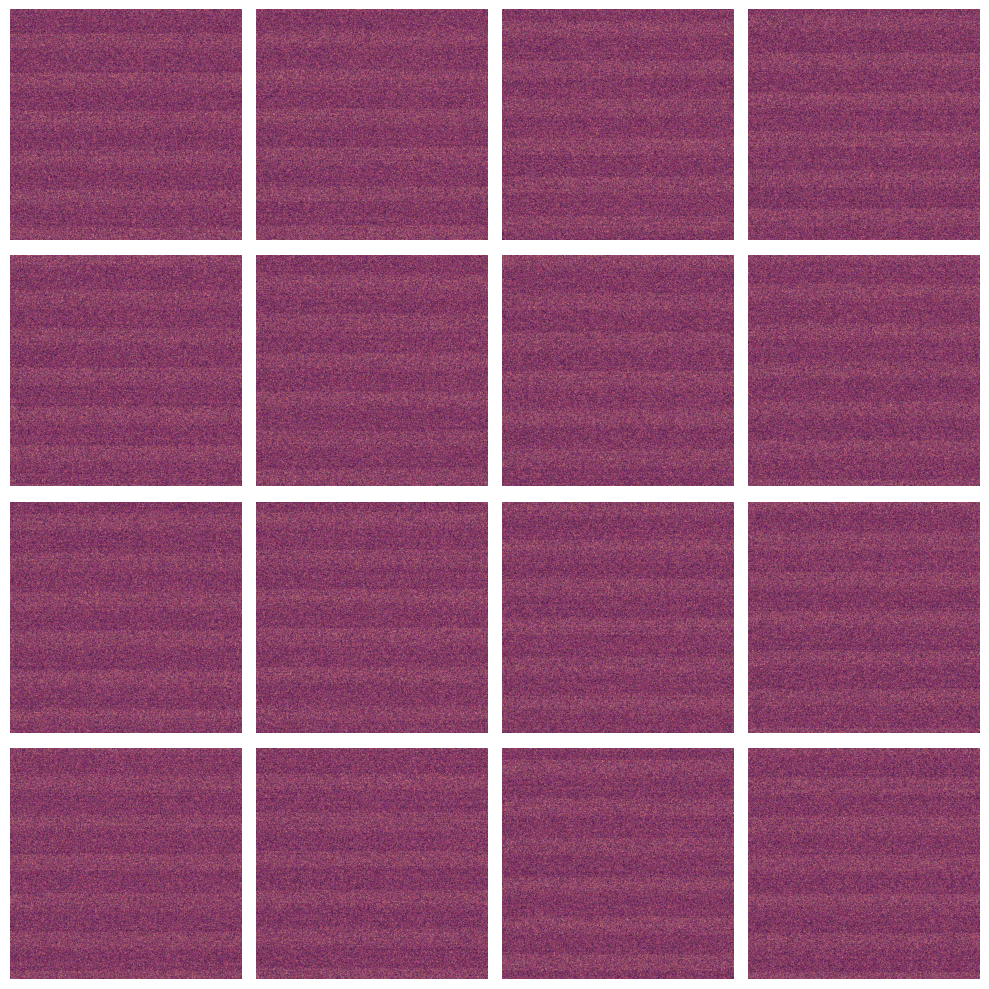

In [56]:
fnames = sorted(glob("calib/bias/*.fit"))

n = 4
fig,ax = plt.subplots(n,n,figsize=(10,10))
ax = ax.ravel()

for i,a in enumerate(ax):
    plt.sca(a)
    qimshow(fits.getdata(fnames[i])[::3,::3])
    a.set_axis_off()
plt.tight_layout()

In [45]:
levels = np.array([np.median(fits.getdata(f)) for f in tqdm(fnames)])

100%|████████████████████████████████████████████████████████████████████████████████| 288/288 [00:33<00:00,  8.52it/s]


In [54]:
%time levels_test = np.array(Parallel(n_jobs=30)(delayed(lambda x: np.median(fits.getdata(x)))(f) for f in fnames))

CPU times: total: 406 ms
Wall time: 2.7 s


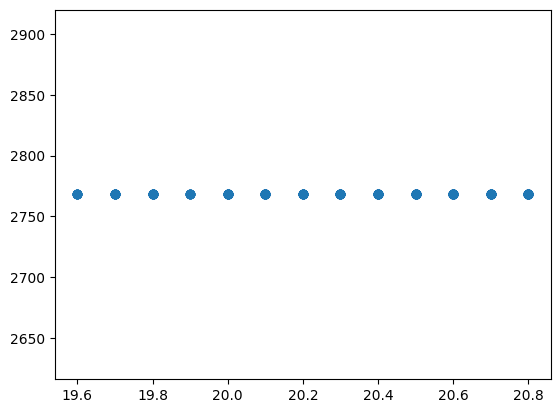

In [149]:
temps = np.array([fits.getval(f,"CCD-TEMP") for f in fnames])
plt.scatter(temps[mask],levels[mask])

In [57]:
np.allclose(levels.astype(float), levels_test.astype(float))

True

In [63]:
mask = levels < 1e4

In [64]:
sum(mask)

np.int64(250)

In [76]:
%%time 
cube = np.array(Parallel(n_jobs=10)(delayed(lambda x: fits.getdata(x))(f) for f in np.array(fnames)[mask]))
cube = np.transpose(cube,axes=[1,2,0])

CPU times: total: 6.67 s
Wall time: 7.97 s


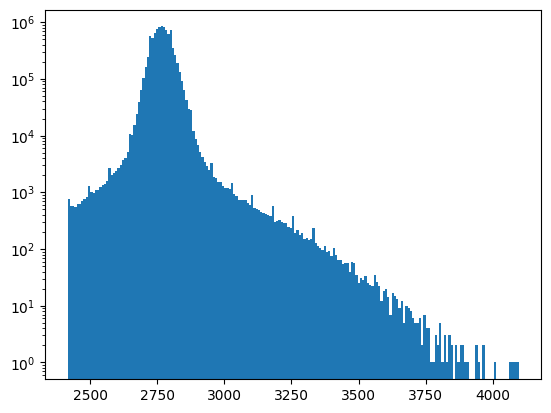

In [173]:
qhist(cube[:,:,1].ravel(),bins=200,qmin=0.001,qmax=1,log=True);

In [77]:
n = 8
chunks = covered_array_split_multi_axis(cube,[8,8])

In [90]:
%%time
results = Parallel(n_jobs=25)(delayed(lambda A: ArrayCover(np.median(A.array,axis=-1)))(x) for x in chunks.ravel())
BIAS_median = covered_array_join_multi_axis(np.reshape(results,chunks.shape))

CPU times: total: 7.09 s
Wall time: 9.41 s


In [91]:
%%time
results = Parallel(n_jobs=25)(delayed(lambda A: ArrayCover(median_abs_deviation(A.array,axis=-1,scale="normal")))(x) for x in chunks.ravel())
BIAS_mad = covered_array_join_multi_axis(np.reshape(results,chunks.shape))

CPU times: total: 8.31 s
Wall time: 27.6 s


In [92]:
%%time
results = Parallel(n_jobs=25)(delayed(lambda A: ArrayCover(np.mean(A.array,axis=-1)))(x) for x in chunks.ravel())
BIAS_mean = covered_array_join_multi_axis(np.reshape(results,chunks.shape))

CPU times: total: 7.34 s
Wall time: 8.41 s


In [93]:
%%time
results = Parallel(n_jobs=25)(delayed(lambda A: ArrayCover(np.std(A.array,axis=-1)))(x) for x in chunks.ravel())
BIAS_std = covered_array_join_multi_axis(np.reshape(results,chunks.shape))

CPU times: total: 8.66 s
Wall time: 9.79 s


In [95]:
BIAS_mad

array([[35.58245324, 47.44327099, 35.58245324, ..., 29.65204437, 35.58245324, 41.51286212],
       [29.65204437, 44.47806656, 35.58245324, ..., 32.61724881, 41.51286212, 29.65204437],
       [35.58245324, 47.44327099, 35.58245324, ..., 35.58245324, 35.58245324, 35.58245324],
       ...,
       [83.02572424, 29.65204437, 35.58245324, ..., 29.65204437, 29.65204437, 35.58245324],
       [74.13011093, 35.58245324, 35.58245324, ..., 35.58245324, 35.58245324, 41.51286212],
       [29.65204437, 41.51286212, 35.58245324, ..., 35.58245324, 29.65204437, 35.58245324]], shape=(3008, 3008))

In [124]:
keys_to_inherit = ['EXPOINUS', 'GAIN', 'OFFSET', 'WB_RED', 'WB_BLUE', 'CBLACK', 'CWHITE', 'PEDESTAL', 
                   'SWCREATE', 'SWOWNER', 'DATE-OBS', 'BAYERPAT', 'COLORTYP', 
                   'INPUTFMT', 'INSTRUME', 'XPIXSZ', 'YPIXSZ', 'EXPOSURE', 'EXPTIME', 'CCD-TEMP']

In [151]:
base_cards = fits.getheader(fnames[0]).cards

In [153]:
new_cards = [c for c in base_cards if c[0] in keys_to_inherit] + [
    ("SENSOR","IMX 533"),
    ("IMAGETYP","BIAS","image calibration class or OBJECT"),
    ("TELESCOP", "Meade LX200", "Model of the telescope used"),
    ("OBSERVER", "Santiago Henao, Samuel Norena"),
]

In [174]:
primary = fits.PrimaryHDU(data=BIAS_mean)
primary.header.extend(new_cards)
primary.header.add_comment("Mean of 250 BIAS")

In [175]:
hdus = [
    primary,
    fits.ImageHDU(data=BIAS_std,name="std"),
    fits.ImageHDU(data=BIAS_std,name="median"),
    fits.ImageHDU(data=BIAS_std,name="mad")
]

In [176]:
fits.HDUList(hdus=hdus).writeto("master_BIAS.fit",overwrite=True)

# DARK and dead pixels

In [331]:
fname = "calib/dark/DARK_30s.fit"
DARK = fits.getdata(fname).astype(float)
dark = BayerImage.from_array(DARK)

In [332]:
def anomaly(C):
    return C - ndi.median_filter(C,5)
@tz.curry
def anomaly_mask(C,th=4000):
    return abs(C - ndi.median_filter(C,5)) < 4000
dark_anomaly = dark.apply(anomaly)
pixel_mask = dark.apply(anomaly_mask)

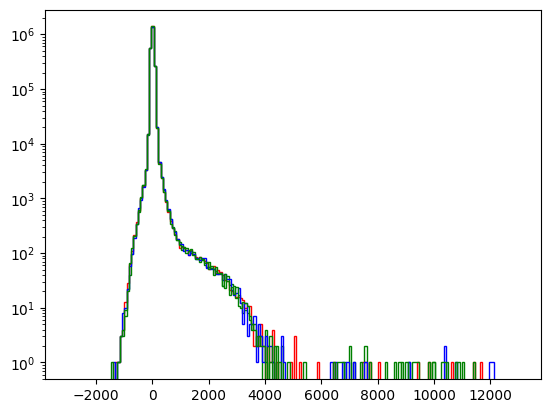

In [333]:
for c in "R G1 B G2".split():
    plt.hist(getattr(dark_anomaly,c).ravel(),bins=np.linspace(-3000,13000,200),log=True,histtype="step",color=c[0].lower());

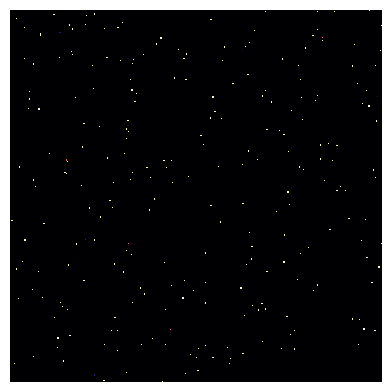

In [341]:
#plt.figure(figsize=(10,10),dpi=300)
p = plt.matshow(ndi.maximum_filter(abs(dark_anomaly.B),5),1,vmin=4000,vmax=5000)
plt.gca().set_axis_off()

In [348]:
np.uint8(0)-1

C:\Users\s.henao10\AppData\Local\Temp\ipykernel_17796\302664494.py:1: RuntimeWarning: overflow encountered in scalar subtract
  np.uint8(0)-1


np.uint8(255)

In [357]:
keys_to_inherit = ['EXPOINUS', 'GAIN', 'OFFSET', 'WB_RED', 'WB_BLUE', 'CBLACK', 'CWHITE', 'PEDESTAL', 
                   'SWCREATE', 'SWOWNER', 'DATE-OBS', 'BAYERPAT', 'COLORTYP', 
                   'INPUTFMT', 'INSTRUME', 'XPIXSZ', 'YPIXSZ', 'EXPOSURE', 'EXPTIME', 'CCD-TEMP']

base_cards = fits.getheader(fname).cards

new_cards = [c for c in base_cards if c[0] in keys_to_inherit] + [
    ("SENSOR","IMX 533"),
    ("IMAGETYP","PIXEL","image calibration class or OBJECT"),
    ("TELESCOP", "Meade LX200", "Model of the telescope used"),
    ("OBSERVER", "Santiago Henao, Samuel Norena"),
]

#primary = fits.PrimaryHDU(data=(10000*(1-pixel_mask.to_array().astype(np.uint16))))
primary = fits.PrimaryHDU(data=pixel_mask.to_array().astype(np.uint8))
primary.header.extend(new_cards)
primary.header.add_comment("Centered median filter of size 5 to a DARK frame, True if difference > 4000 ADU")

fits.HDUList(hdus=[primary]).writeto("dead_pixel_mask_visual.fit",overwrite=True)

# FLAT

In [358]:
fnames = sorted(glob("calib/flat/*.fit"))
fnames_by_exptime = tz.groupby(lambda f: fits.getval(f,"EXPTIME"),fnames)

In [359]:
fnames_by_exptime.keys()

dict_keys([0.05, 0.1, 0.2, 0.5, 1.5, 1.0])

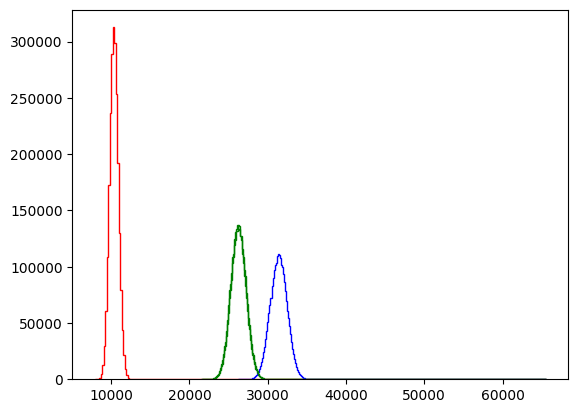

In [360]:
flat = BayerImage.from_array(fits.getdata(fnames_by_exptime[1.0][0]).astype(float))
for c in "R G1 B G2".split():
    plt.hist(getattr(flat,c).ravel(),bins=300,histtype="step",color=c[0].lower());

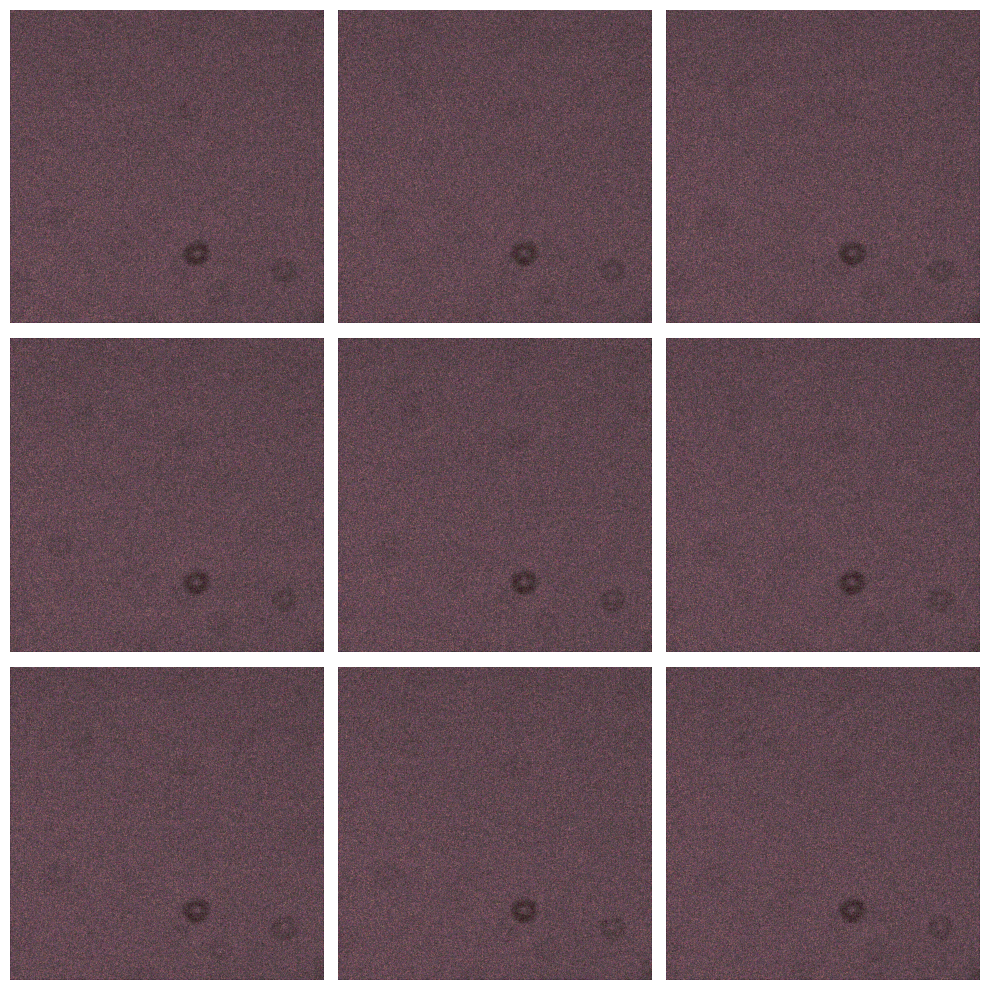

In [361]:
n = 3
fig,ax = plt.subplots(n,n,figsize=(10,10))
ax = ax.ravel()

for i,a in enumerate(ax):
    plt.sca(a)
    qimshow(fits.getdata(fnames_by_exptime[0.5][i])[::3,::3],qmin=0.4,qmax=0.8)
    a.set_axis_off()
plt.tight_layout()

In [ ]:
#%time levels_test = np.array(Parallel(n_jobs=30)(delayed(lambda x: np.median(fits.getdata(x)))(f) for f in fnames))

In [368]:
def fname_means(fnames):
    cube = np.array([fits.getdata(f).astype(float) for f in fnames])
    return cube.mean(axis=0)

In [369]:
len(fnames_by_exptime)

6

In [370]:
%%time 
result = Parallel(n_jobs=6)(
    delayed(fname_means)(f) for f in fnames_by_exptime.values()
)

CPU times: total: 609 ms
Wall time: 6.86 s


In [374]:
FLAT_means = dict(zip(fnames_by_exptime,result))

In [423]:
from scipy.stats import gaussian_kde
from scipy.optimize import minimize_scalar

def kde_mode(data,dx=1000):
    pdf = gaussian_kde(data)
    x0 = np.median(data)
    sol = minimize_scalar(lambda x: -pdf(x)[0], bounds=(x0-dx,x0+dx))
    return sol.x

def mode_normalization(image,dx=1000):
    return image / kde_mode(image.ravel(),dx=dx)

def bayer_mode_normalization(array):
    img = BayerImage.from_array(array)
    img.apply(mode_normalization,inplace=True)
    return img.to_array()

In [424]:
%%time 
result = Parallel(n_jobs=6)(
    delayed(bayer_mode_normalization)(x) for x in FLAT_means.values()
)

CPU times: total: 781 ms
Wall time: 23 s


In [426]:
FLAT_normalized = dict(zip(fnames_by_exptime,result))

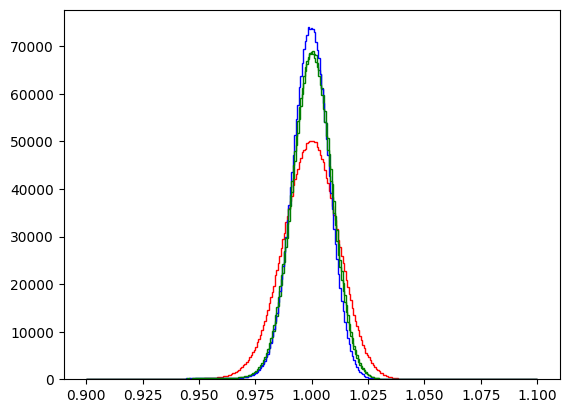

In [440]:
test = BayerImage.from_array(FLAT_normalized[1.0])
for c in "R G1 B G2".split():
    plt.hist(getattr(test,c).ravel(),bins=np.linspace(0.9,1.1,300),histtype="step",color=c[0].lower());

In [443]:
for i,k in enumerate(sorted(FLAT_normalized.keys(),reverse=True)):
    fname = fnames_by_exptime[k][0]
    keys_to_inherit = ['EXPOINUS', 'GAIN', 'OFFSET', 'WB_RED', 'WB_BLUE', 'CBLACK', 'CWHITE', 'PEDESTAL', 
                       'SWCREATE', 'SWOWNER', 'DATE-OBS', 'BAYERPAT', 'COLORTYP', 
                       'INPUTFMT', 'INSTRUME', 'XPIXSZ', 'YPIXSZ', 'EXPOSURE', 'EXPTIME', 'CCD-TEMP']
    
    base_cards = fits.getheader(fname).cards
    
    new_cards = [c for c in base_cards if c[0] in keys_to_inherit] + [
        ("SENSOR","IMX 533"),
        ("IMAGETYP","FLAT","image calibration class or OBJECT"),
        ("TELESCOP", "Meade LX200", "Model of the telescope used"),
        ("OBSERVER", "Santiago Henao, Samuel Norena"),
    ]
    
    #primary = fits.PrimaryHDU(data=(10000*(1-pixel_mask.to_array().astype(np.uint16))))
    primary = fits.PrimaryHDU(data=FLAT_normalized[k])
    primary.header.extend(new_cards)
    primary.header.add_comment("Mean of 30 flats, normalized by the KDE mode")
    
    fits.HDUList(hdus=[primary]).writeto(f"flat_{k}.fit",overwrite=True)

# science

In [39]:
def reduce_image_and_export(sci_path, bias_path, flat_path, dead_pixel_mask_path, sigma_gaussian_kernel=2., object_name="Unspecified", output_name=None):
    raw = fits.getdata(sci_path).astype(float)
    bias = fits.getdata(bias_path)
    flat = fits.getdata(flat_path)
    mask = fits.getdata(dead_pixel_mask_path)

    raw[mask == 0] = np.nan
    processed = (raw-bias) / flat

    color = BayerImage.from_array(processed)
    kernel = Gaussian2DKernel(sigma_gaussian_kernel)
    color.apply(lambda x: interpolate_replace_nans(x, kernel),inplace=True)

    reduced = color.to_cube()

    # export 
    keys_to_inherit = ['EXPOINUS', 'GAIN', 'OFFSET', 'WB_RED', 'WB_BLUE', 'CBLACK', 'CWHITE', 'PEDESTAL', 
                       'SWCREATE', 'SWOWNER', 'DATE-OBS', 'BAYERPAT', 'COLORTYP', 
                       'INPUTFMT', 'INSTRUME', 'XPIXSZ', 'YPIXSZ', 'EXPOSURE', 'EXPTIME', 'CCD-TEMP']
    base_cards = fits.getheader(sci_path).cards
    new_cards = [c for c in base_cards if c[0] in keys_to_inherit] + [
        ("SENSOR","IMX 533"),
        ("IMAGETYP","OBJECT","image calibration class or OBJECT"),
        ("OBJECT", object_name, "Target object name"),
        ("TELESCOP", "Meade LX200", "Model of the telescope used"),
        ("OBSERVER", "Santiago Henao, Samuel Norena"),
        ("PROCID",str(datetime.now())+ " UTC-5","Calibration time")
    ]
    primary = fits.PrimaryHDU(data=reduced)
    primary.header.extend(new_cards)
    primary.header.add_comment("Reduced with BIAS, FLAT and dead pixel mask")

    name_components = os.path.split(sci_path)
    out_name = os.path.join(name_components[0],"Reduced_"+name_components[1]) if output_name is None else output_name
    fits.HDUList(hdus=[primary]).writeto(out_name,overwrite=True)

    #cube = color.to_cube()

In [41]:
%%time 
fnames = glob("M80/Light*.fit")
foo = lambda x: reduce_image_and_export(x,
        bias_path="master_BIAS.fit",
        flat_path="flat_1.0.fit",
        dead_pixel_mask_path="dead_pixel_mask.fit",
        object_name="M80"
    )
Parallel(n_jobs=10)(
    delayed(foo)(x) for x in fnames
)

CPU times: total: 78.1 ms
Wall time: 3.89 s


[None, None, None, None, None, None, None, None, None, None]

In [42]:
%%time 
fnames = glob("M90/Light*.fit")
foo = lambda x: reduce_image_and_export(x,
        bias_path="master_BIAS.fit",
        flat_path="flat_1.0.fit",
        dead_pixel_mask_path="dead_pixel_mask.fit",
        object_name="M90"
    )
Parallel(n_jobs=10)(
    delayed(foo)(x) for x in fnames
)

CPU times: total: 31.2 ms
Wall time: 5.29 s


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Stacking

In [182]:
from skimage.feature import peak_local_max
from sklearn.neighbors import NearestNeighbors

In [43]:
fnames = glob("M80/Reduced*.fit")

In [45]:
%time all_data = np.array([fits.getdata(f) for f in fnames])

CPU times: total: 453 ms
Wall time: 504 ms


In [48]:
red = all_data[:,0,:,:]

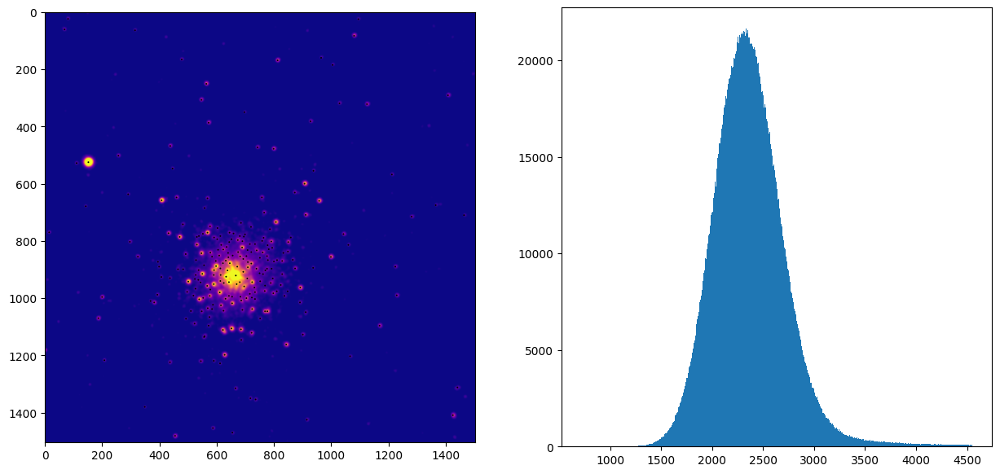

In [262]:
peak = peak_local_max(ndi.gaussian_filter(red[0],3),threshold_abs=3000)
fig,ax = plt.subplots(1,2,figsize=(15,7))
plt.sca(ax[0]) 
plt.imshow(ndi.gaussian_filter(red[0],3),vmin=2500,vmax=15000,norm="log",cmap="plasma")
plt.scatter(*peak.T[::-1],ec="none",c='k',s=2)
plt.sca(ax[1]); qhist(red[0].ravel(),qmin=0,qmax=0.99,bins=500);

In [263]:
ref_peak = peak_local_max(ndi.gaussian_filter(red[0],3),threshold_abs=2500)
neigh = NearestNeighbors(n_neighbors=1)
neigh.fit(ref_peak)

NearestNeighbors(n_neighbors=1)

In [264]:
peak = peak_local_max(ndi.gaussian_filter(red[1],3),threshold_abs=3000)

In [291]:
distances,neighbors = neigh.kneighbors(peak)
mask = distances.ravel() < 30
weights = np.array([red[0][a,b] for a,b in ref_peak[neighbors.ravel()]])

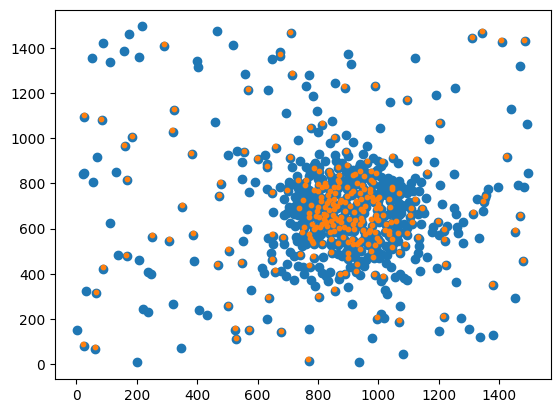

In [269]:
plt.scatter(*ref_peak.T)
plt.scatter(*peak[mask].T,s=10)

In [315]:
def affine(x,points):
    d1,d2,c1,c2,o1,o2 = x
    return np.array([[d1,c1],[c2,d2]]) @ points.T + np.array([o1,o2])[:,None]

def affine_loss(x,points):
    distances = neigh.kneighbors(affine(x,points).T)[0]
    return (distances*weights[mask]**2).sum()

def affine_img(x,img,**kwargs):
    d1,d2,c1,c2,o1,o2 = x
    return ndi.affine_transform(img,np.linalg.inv([[d1,c1],[c2,d2]]),[-o1,-o2],**kwargs)


In [316]:
res = opt.minimize(lambda x: affine_loss(x,peak[mask]),x0=[1,1,0,0,0,0],bounds=np.array([[0.9,0.9,-0.1,-0.1,-120,-120],[1.1,1.1, 0.1, 0.1, 120, 120]]).T)

In [317]:
res.x

array([ 1.00044252e+00,  1.00045260e+00, -2.99372215e-04, -7.79597726e-04,  1.08046944e+00, -6.12912255e+00])

In [318]:
affine_loss([1,1,0,0,0,0],peak[mask])

np.float64(53393451144027.945)

In [319]:
affine_loss(res.x,peak[mask])

np.float64(9502226451724.283)

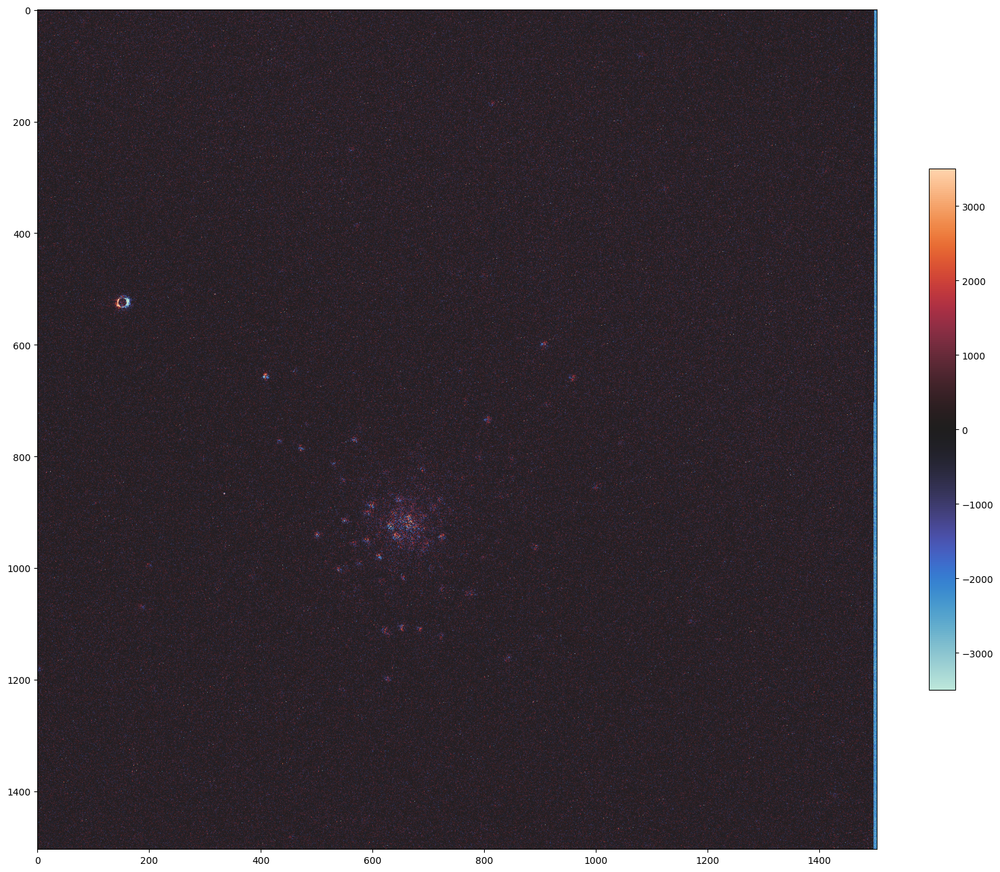

In [320]:
plt.figure(figsize=(20,20))
p = plt.imshow(affine_img(res.x,red[1])-red[0],cmap=divcmap,vmin=-3500,vmax=3500)
plt.colorbar(p,shrink=0.5)

In [310]:
affine(res.x,peak[mask])

array([[ 525.14810165,  920.2202876 ,  924.23554816,  944.24567796,  888.22446427,  658.140868  ,  903.21979678,
         877.19875574,  951.2705775 ,  915.26139512,  941.29726805,  944.21487327, 1106.35165045,  979.28156465,
         771.15697138,  951.23977281,  943.23016845,  734.04100635, 1003.32482933,  599.91179358,  891.18428332,
         890.19805727,  901.23631585,  786.20364503,  958.23500858,  908.20226816, 1111.36644773,  843.2133666 ,
        1017.29058106,  823.14581079,  659.93343595, 1109.34113328, 1198.42349974,  878.17129082,  963.16385698,
         918.2390885 , 1038.27818989, 1046.26345475,  957.28300996,  939.25369897,  855.04998068, 1162.31695935,
         813.19912267, 1046.26687749,  947.25417602,  991.30262653,  868.19798137, 1025.31083396,  250.80612665,
         931.21252931,  773.20966777,  708.98413368,  804.07208712,  802.09316985,  168.65586537,  853.16918203,
         878.20894099,  999.25936854, 1121.33519352,  919.24851313, 1001.28886634,   82.4960481 

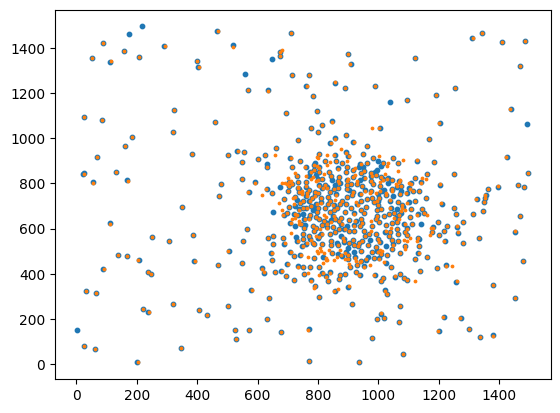

In [261]:
plt.scatter(*ref_peak.T,s=10)
plt.scatter(*affine(res.x,peak[mask]),s=3)

In [117]:

def residuals_affine(x,base_img,input_img):
    return np.sum(
        (base_img - affine(x,input_img,mode="nearest"))**2
    )


In [124]:
def shift(x,img,**kwargs):
    o1,o2 = x
    return ndi.shift(img,[o1,o2],**kwargs)

def residuals_shift(x,base_img,input_img):
    return np.sum(
        (base_img - shift(x,input_img,mode="nearest"))**2
    )

In [125]:
%%time 
res = opt.minimize(
    residuals_shift,
    [0,0],
    bounds=np.array([[-80,-80],[ 80, 80]]).T,
    args=(red[0],red[2]),
    options={"maxiter":100,"disp":True},
    tol=1e-2
)

CPU times: total: 5.92 s
Wall time: 5.96 s


In [126]:
res.x

array([-0.48142733, -3.45042559])

In [127]:
%%time 
res2 = opt.minimize(
    residuals_affine,
    [1,1,0,0,*res.x],
    bounds=np.array([[0.9,0.9,-0.1,-0.1,-12,-12],[1.1,1.1, 0.1, 0.1, 12, 12]]).T,
    args=(red[0],red[2]),
    options={"maxiter":100,"disp":True},
    tol=1e-2
)
                    

CPU times: total: 4.62 s
Wall time: 4.67 s


In [132]:
res2.x

array([ 0.99575023,  1.00424977, -0.00424977,  0.00424977, -0.97093964, -2.79381875])

In [130]:
affine(res2.x,red[0])-red[0]

array([[-2012.05345397, -2537.32199555, -2255.54753033, ..., -2755.53969216, -1763.90368297, -2021.49535702],
       [-2012.05345397, -1830.53200305, -2375.81222197, ..., -2455.78119036, -2286.07377929, -2110.16226379],
       [-1881.00584548, -2679.72875017, -1999.26198912, ..., -2304.2561696 , -2763.91391492, -2878.87541539],
       ...,
       [  288.05518317,  -199.28600815,  -162.57346009, ..., -2779.19035157, -2402.59176437, -2619.92473822],
       [ -748.70354139,   119.18420416,  -527.00673257, ..., -1884.31991142, -2386.18438743, -2758.3613838 ],
       [ -710.09697113,  -334.69352967,  -472.54110569, ..., -2333.69070287, -2354.81131363, -2035.31045387]],
      shape=(1504, 1504))

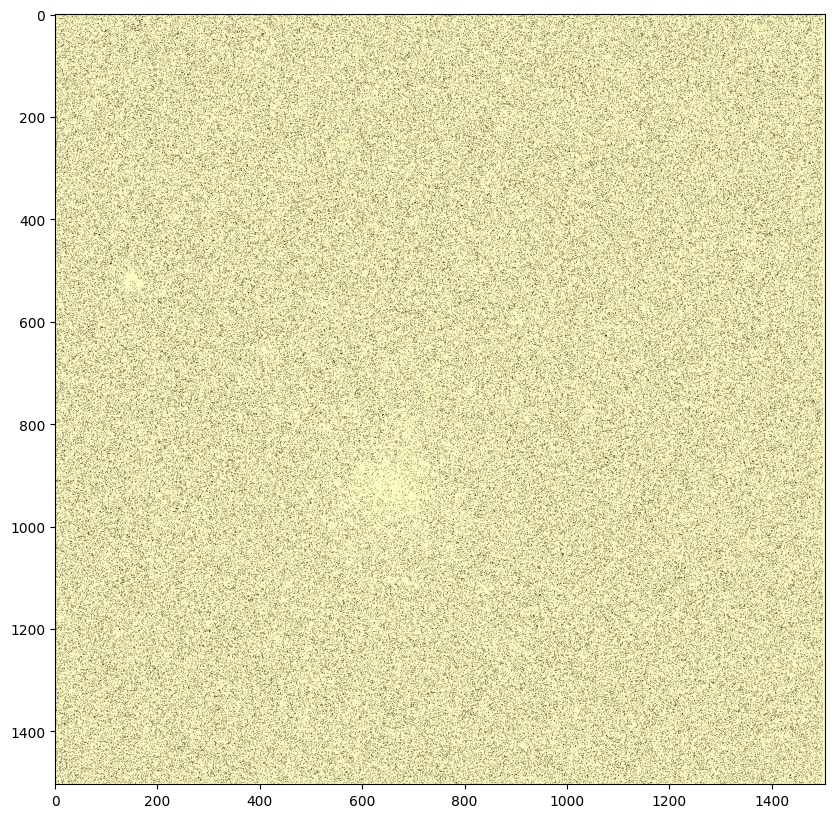

In [140]:
plt.figure(figsize=(10,10))
plt.imshow((shift(res.x,red[2])-red[0])**2,vmin=2000,vmax=5000,norm="log")

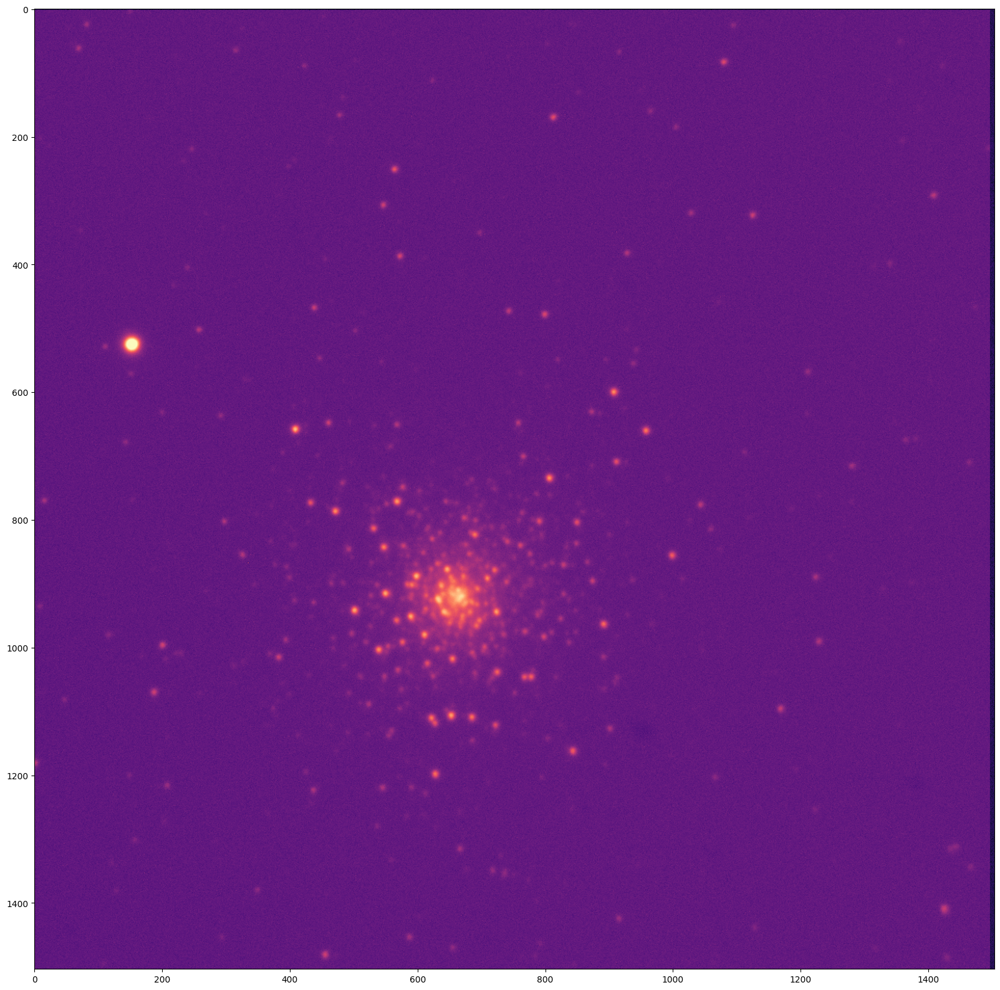

In [102]:
plt.figure(figsize=(20,20))
plt.imshow(affine(res.x,red[1])+red[0],norm="log")